In [1]:
import pandas as pd 
import os
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
archivo = pd.read_csv("data.csv") #leemos el archivo
archivo.head()

,Age,Height_cm,Weight_kg,Position,Training_Hours_Per_Week,Matches_Played_Past_Season,Previous_Injury_Count,Knee_Strength_Score,Hamstring_Flexibility,Reaction_Time_ms,Balance_Test_Score,Sprint_Speed_10m_s,Agility_Score,Sleep_Hours_Per_Night,Stress_Level_Score,Nutrition_Quality_Score,Warmup_Routine_Adherence,Injury_Next_Season,BMI
0,22,173,64,Midfielder,11.575308,36,1,77.460279,79.115738,284.487853,91.212476,5.874630,77.599705,8.238293,46.616415,81.472206,1,0,21.383942
1,18,170,67,Midfielder,12.275869,37,2,72.634442,82.541688,250.579249,87.294078,5.796269,94.418987,8.983737,49.368037,81.056677,1,0,23.183391
2,22,186,75,Forward,12.254896,12,2,77.064490,75.943631,269.119918,83.440688,5.731209,70.179176,7.229193,43.132808,64.877457,0,1,21.678807
3,20,172,62,Defender,9.006678,11,1,82.810232,73.878324,226.376412,87.591894,6.220212,83.473824,7.681029,51.528529,89.824744,1,0,20.957274
4,18,172,94,Midfielder,12.683668,10,2,76.772859,76.653043,229.021042,83.125161,5.385958,87.037256,6.728091,52.379718,71.569197,0,1,31.773932


Ahora usaremos la función .info() para conocer las características del archivo y todas sus columnas.

In [4]:
archivo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         800 non-null    int64  
 1   Height_cm                   800 non-null    int64  
 2   Weight_kg                   800 non-null    int64  
 3   Position                    800 non-null    object 
 4   Training_Hours_Per_Week     800 non-null    float64
 5   Matches_Played_Past_Season  800 non-null    int64  
 6   Previous_Injury_Count       800 non-null    int64  
 7   Knee_Strength_Score         800 non-null    float64
 8   Hamstring_Flexibility       800 non-null    float64
 9   Reaction_Time_ms            800 non-null    float64
 10  Balance_Test_Score          800 non-null    float64
 11  Sprint_Speed_10m_s          800 non-null    float64
 12  Agility_Score               800 non-null    float64
 13  Sleep_Hours_Per_Night       800 non

En la tabla obtenida de archivo.info() vemos que ningún dato es nulo, pero para asegurarnos utilizaremos la función .isnull() para verificar si pertenece al tipo nulo, en conjunto de .sum() para obtener el número total de hipoteticos datos nulos.

In [6]:
archivo.isnull().sum()

Age                           0
Height_cm                     0
Weight_kg                     0
Position                      0
Training_Hours_Per_Week       0
Matches_Played_Past_Season    0
Previous_Injury_Count         0
Knee_Strength_Score           0
Hamstring_Flexibility         0
Reaction_Time_ms              0
Balance_Test_Score            0
Sprint_Speed_10m_s            0
Agility_Score                 0
Sleep_Hours_Per_Night         0
Stress_Level_Score            0
Nutrition_Quality_Score       0
Warmup_Routine_Adherence      0
Injury_Next_Season            0
BMI                           0
dtype: int64

Como podemos ver, ningún dato es del tipo nulo.

Luego, para obtener datos estadísticos sobre el archivo, usamos la función .describe()

In [9]:
archivo.describe()

,Age,Height_cm,Weight_kg,Training_Hours_Per_Week,Matches_Played_Past_Season,Previous_Injury_Count,Knee_Strength_Score,Hamstring_Flexibility,Reaction_Time_ms,Balance_Test_Score,Sprint_Speed_10m_s,Agility_Score,Sleep_Hours_Per_Night,Stress_Level_Score,Nutrition_Quality_Score,Warmup_Routine_Adherence,Injury_Next_Season,BMI
count,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000
mean,21.135000,177.407500,73.235000,9.951150,22.332500,1.536250,74.933249,79.154123,249.423244,83.832337,5.949025,78.341311,7.417124,54.039342,74.382174,0.597500,0.500000,23.377364
std,1.991037,7.148974,9.929276,2.610395,10.311516,1.292584,6.672704,6.782332,22.532387,6.931657,0.329133,8.775418,0.793183,11.421143,9.324899,0.490708,0.500313,3.673279
min,18.000000,154.000000,45.000000,5.000000,5.000000,0.000000,52.391351,58.180381,180.000000,60.059484,4.862435,50.000000,5.000000,21.561186,50.000000,0.000000,0.000000,14.346326
25%,19.000000,173.000000,66.000000,8.127151,13.000000,1.000000,70.432656,74.495959,234.089585,79.044910,5.732552,72.675392,6.850062,45.775371,67.809084,0.000000,0.000000,20.786644
50%,21.000000,177.000000,73.000000,9.895710,22.000000,1.000000,74.997933,79.187909,249.127328,84.156236,5.937692,78.340973,7.424618,54.047208,74.363878,1.000000,0.500000,23.130560
75%,23.000000,182.000000,80.000000,11.535140,32.000000,2.000000,79.632391,83.813179,265.105082,88.877902,6.159205,84.093489,7.988100,61.910804,80.502613,1.000000,1.000000,26.024182
max,24.000000,200.000000,105.000000,18.866608,39.000000,8.000000,93.900051,100.000000,306.730851,100.000000,6.898228,100.000000,9.860553,87.065007,100.000000,1.000000,1.000000,36.262439


De él podemos analizar diferentes columnas y corroborar veracidad, por ejemplo los valores del parámetro "Trainin_Hours_Per_Week" tienen sentido
ya que no exceden el tiempo máximo de horas en siete días, con el valor más alto de 18.86 horas por semana, lo que indica que dicha persona entrena 2.7 horas por día en promedio.

Ahora verificaremos si existen o no datos duplicados

In [12]:
duplicados = archivo.duplicated()
print(duplicados)

0      False
1      False
2      False
3      False
4      False
       ...  
795    False
796    False
797    False
798    False
799    False
Length: 800, dtype: bool


In [13]:
print(duplicados.any()) #false si no hay ningún dato duplicado, true caso contrario

False


Para mejorar la lectura del archivo, cambiaremos el tipo de la columna 'Injury_Next_Season' de int a bool

In [15]:
archivo['Injury_Next_Season'] = archivo['Injury_Next_Season'].astype(bool)
archivo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         800 non-null    int64  
 1   Height_cm                   800 non-null    int64  
 2   Weight_kg                   800 non-null    int64  
 3   Position                    800 non-null    object 
 4   Training_Hours_Per_Week     800 non-null    float64
 5   Matches_Played_Past_Season  800 non-null    int64  
 6   Previous_Injury_Count       800 non-null    int64  
 7   Knee_Strength_Score         800 non-null    float64
 8   Hamstring_Flexibility       800 non-null    float64
 9   Reaction_Time_ms            800 non-null    float64
 10  Balance_Test_Score          800 non-null    float64
 11  Sprint_Speed_10m_s          800 non-null    float64
 12  Agility_Score               800 non-null    float64
 13  Sleep_Hours_Per_Night       800 non

In [62]:
###----almacenamos el df limpio en un csv nuevo -----
archivo_limpio = archivo.to_csv("Datos_limpio.csv", index=False)

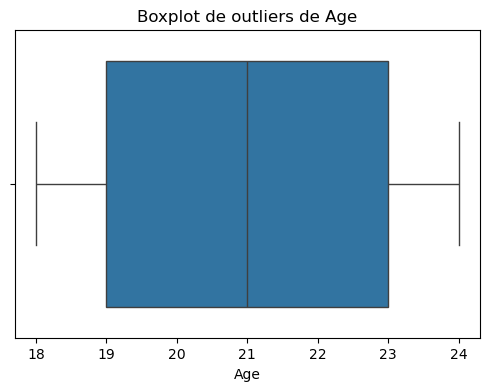

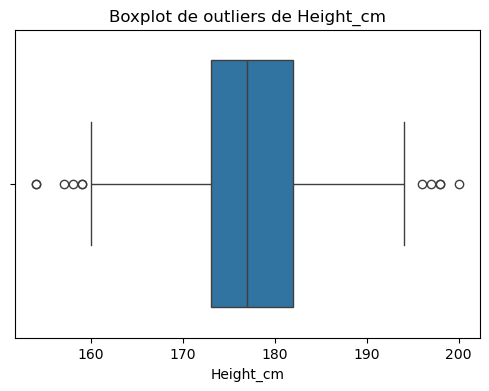

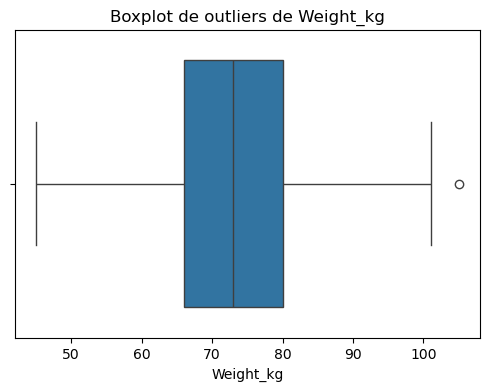

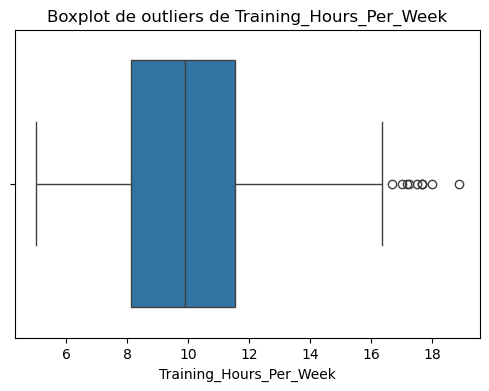

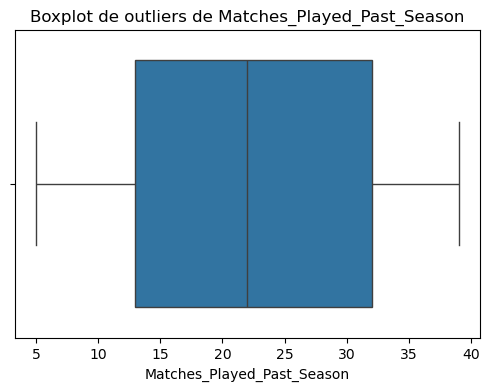

...

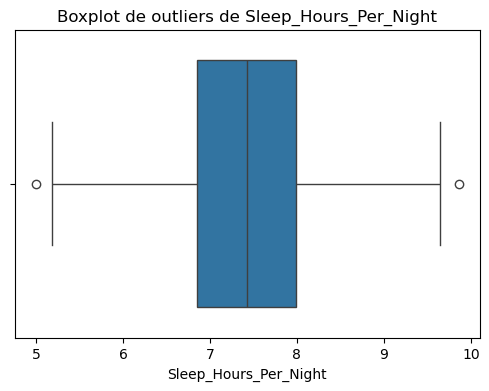

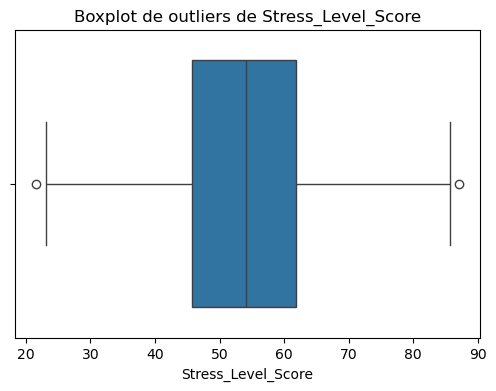

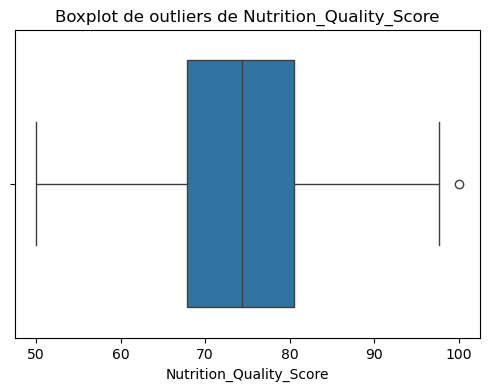

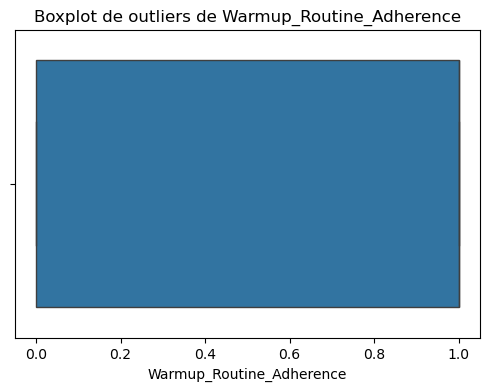

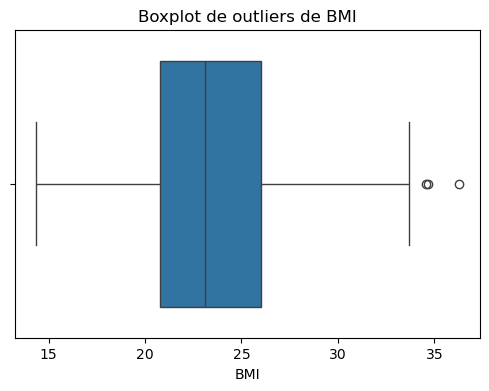

In [16]:
#Ahora detectaremos outliers mediante el uso de boxplots 
col_outliers = archivo.select_dtypes(include = "number").columns
for col in col_outliers:
    plt.figure(figsize = (6,4))
    sns.boxplot(x=archivo[col])
    plt.title(f"Boxplot de outliers de {col}")
    plt.xlabel(col)
    plt.show()
    #en los outliers de forma general se puede apreciar, que si bien existen algunos, ninguno llega a ser un dato que podria ser falso o que no sea real
    #esto se puede ver corroborado con los minimos y maximos vistos en archivo.describe

<function matplotlib.pyplot.show(close=None, block=None)>

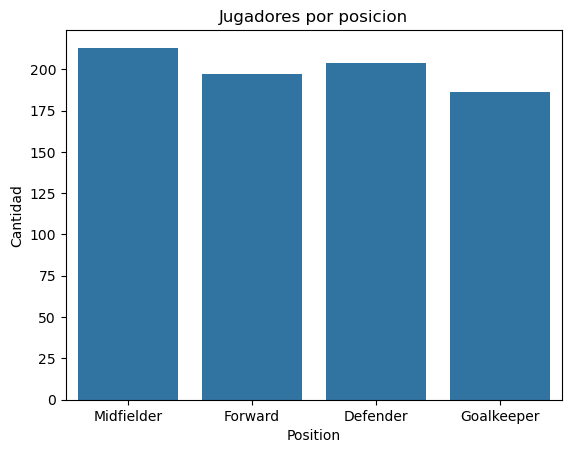

In [17]:
#Ahora crearemos distintos historigramas para ver las variables mas relevantes del csv 
sns.countplot(data = archivo , x = "Position")
plt.title("Jugadores por posicion")
plt.ylabel("Cantidad")
plt.show
#Se aprecia que en general, tenemos casi la misma cantidad de jugadores de cada posicion en nuestro csv

<function matplotlib.pyplot.show(close=None, block=None)>

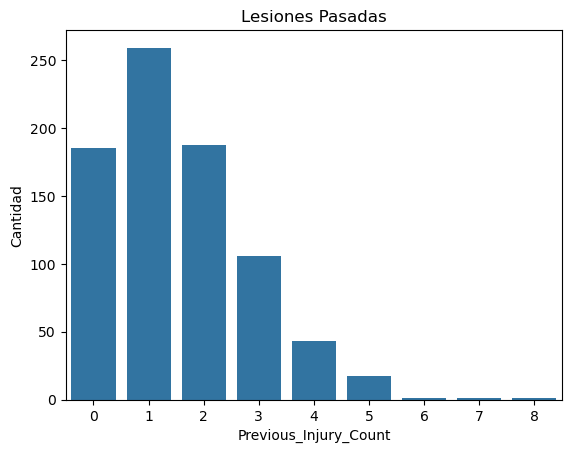

In [18]:
sns.countplot( data=archivo, x="Previous_Injury_Count")
plt.title("Lesiones Pasadas")
plt.ylabel("Cantidad")
plt.show
#Podemos rescatar que un gran numero de jugadores ha tenido 1 o 2 lesiones en el pasado

<function matplotlib.pyplot.show(close=None, block=None)>

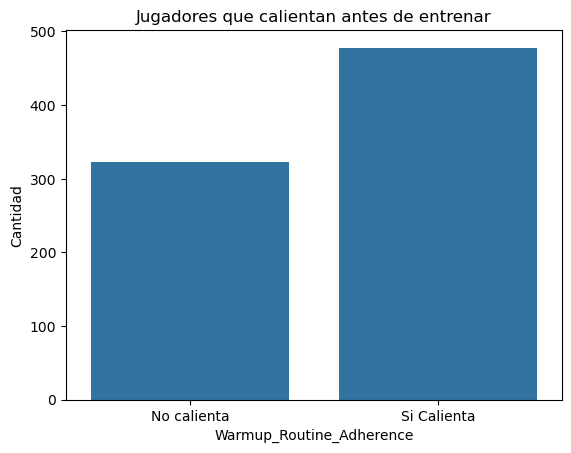

In [19]:
sns.countplot( data=archivo, x="Warmup_Routine_Adherence")
plt.title("Jugadores que calientan antes de entrenar")
plt.xticks([0 , 1], ["No calienta", "Si Calienta"])
plt.ylabel("Cantidad")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

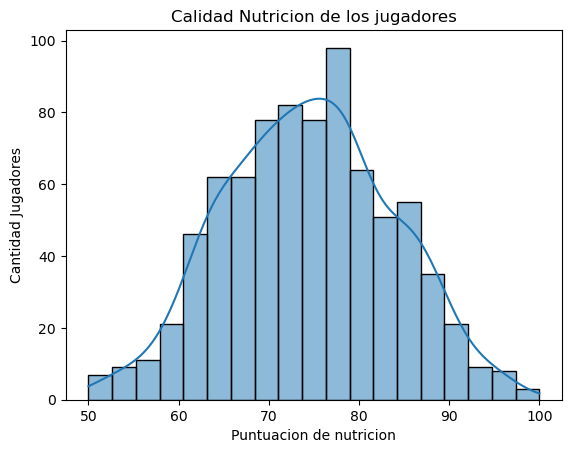

In [20]:
sns.histplot(archivo["Nutrition_Quality_Score"], kde=True)
plt.title("Calidad Nutricion de los jugadores")
plt.ylabel("Cantidad Jugadores")
plt.xlabel("Puntuacion de nutricion")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

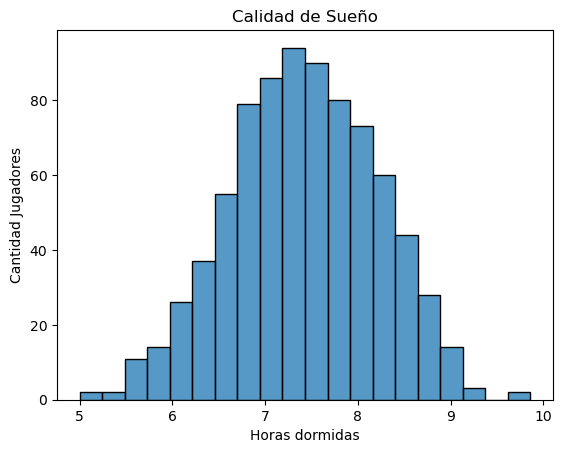

In [21]:
sns.histplot(archivo["Sleep_Hours_Per_Night"])
plt.title("Calidad de Sueño")
plt.ylabel("Cantidad Jugadores")
plt.xlabel("Horas dormidas")
plt.show

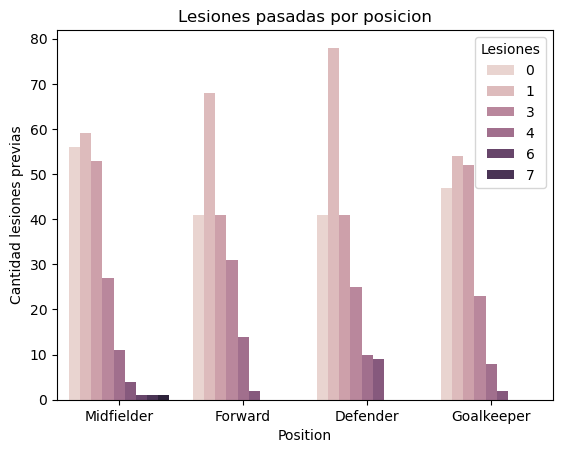

In [22]:
sns.countplot(data = archivo , x = "Position", hue = "Previous_Injury_Count")
plt.title ("Lesiones pasadas por posicion")
plt.legend(title = "Lesiones")
plt.ylabel("Cantidad lesiones previas")
plt.show()

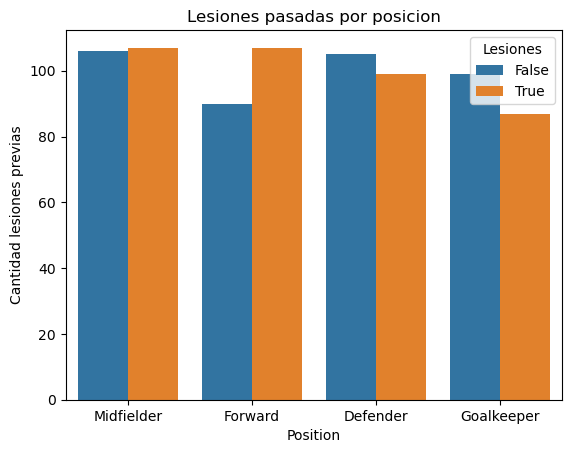

In [23]:
sns.countplot(data = archivo , x = "Position", hue = "Injury_Next_Season")
plt.title ("Lesiones pasadas por posicion")
plt.legend(title = "Lesiones")
plt.ylabel("Cantidad lesiones previas")
plt.show()

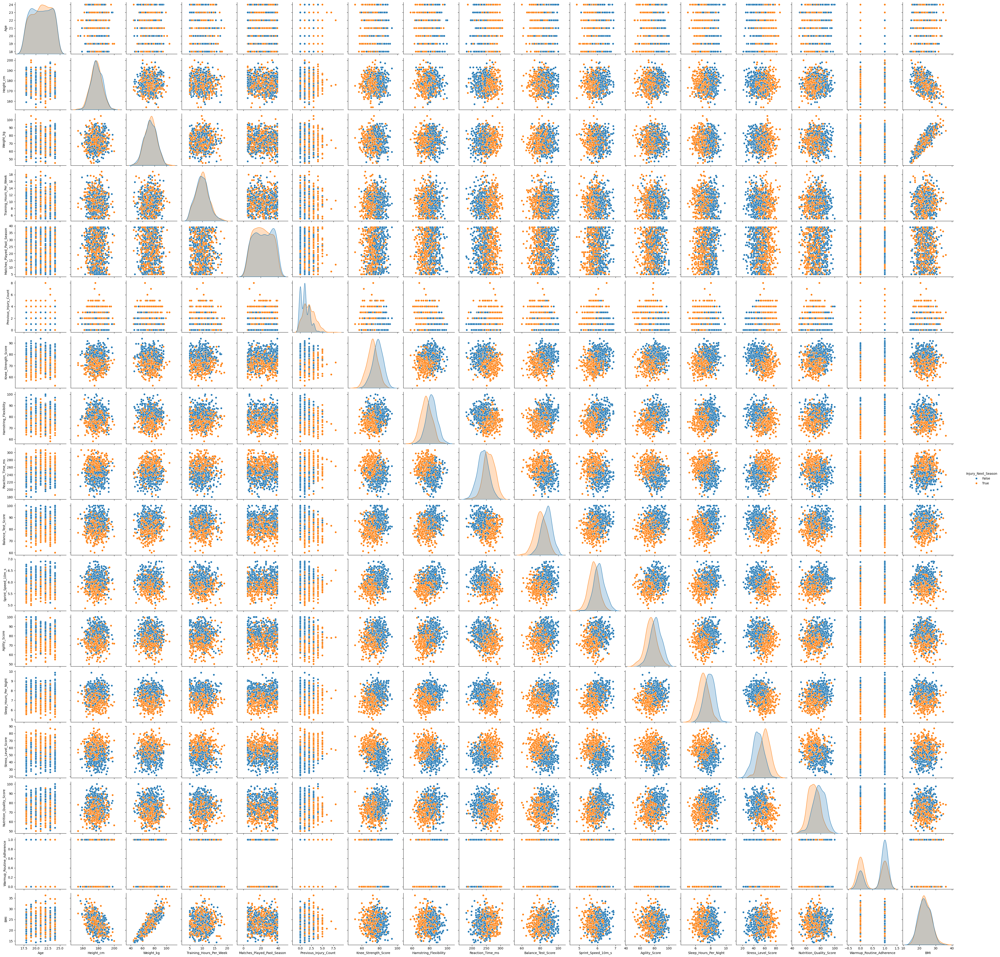

In [24]:
sns.pairplot(data=archivo,hue="Injury_Next_Season")

## Del grafico de los pair plot podemos observar que las columnas que se relacionan a simple vista son el BMI y WEIGHT_KG y que las variables BMI se relaciona negativamente con HEIGHT_cm ,pero no nos da mas informacion que sea notoria. 

<Axes: xlabel='Previous_Injury_Count', ylabel='Injury_Next_Season'>

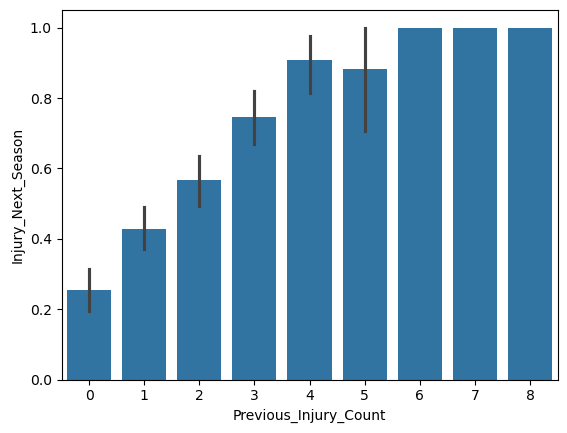

In [26]:
sns.barplot(data=archivo, x="Previous_Injury_Count", y="Injury_Next_Season")

## Vemos como estan distibuidos los datos que relacionan la cantidad de lesiones previas,con respecto a que si el jugador se lesionó a la temporada siguiente.

<Axes: xlabel='Injury_Next_Season', ylabel='Age'>

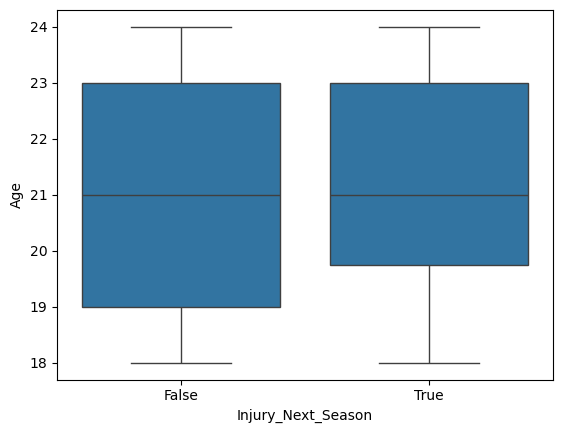

In [28]:
sns.boxplot(data=archivo, x="Injury_Next_Season", y="Age")

### Queremos ver  como estan concentrados los datos cuandos se relacionan la edad, con la columna que nos dice si se lesiono la siguiente temporada.

<Axes: >

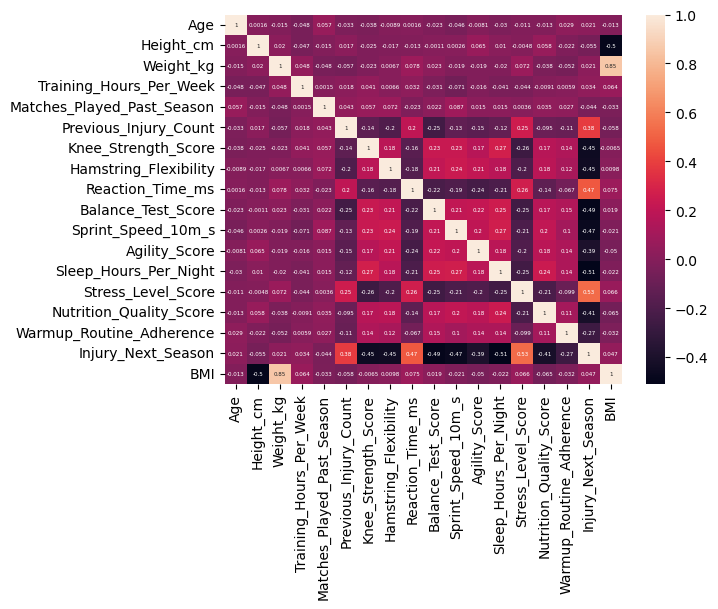

In [30]:
correlacion_numericas=archivo.corr(numeric_only=True)
sns.heatmap(data=correlacion_numericas, annot=True, annot_kws={"size":4})


### Ahora, solo consideramos aquellos en los que la correlacion es positiva y desde 0.3

<Axes: >

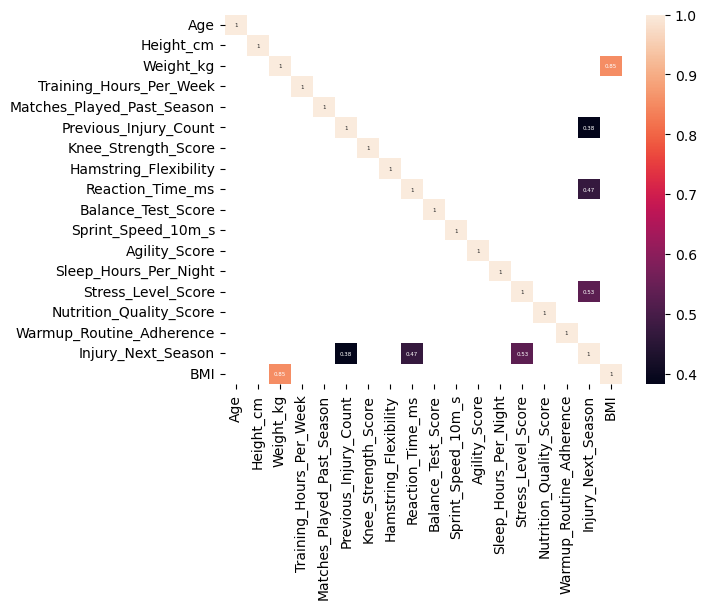

In [32]:
correlaciones=archivo.corr(numeric_only=True)
correlacion_positiva=correlaciones[(correlaciones>=0.3)]
sns.heatmap(data=correlacion_positiva, annot=True, annot_kws={"size":4})

### Ahora con la matriz de correlacion podemos notar aquellas columnas que podemos analizar,las cuales  son "Previus_Injury_Count","Stress Level Score", "Reaction _TIme_ms", "Injury_Next_Season".
### Como se pudo observar existe una amplia relacion entre las columnas "BMI" y "Weight_kg", pero no es coherente con el proposito de nuestro proyecto,por lo que la ignoramos.

### Por lo que luego de analizar la matriz nos cuestionamos nuevamente si nuestras preguntas son coherentes con lo que nos dicen los datos.

- ~~¿Cómo influye la sobrecarga de partidos y entrenamiento en una posible lesión?~~
- ¿Cómo afectan al futbolista sus niveles de estrés, ~~nutrición y falta de sueño~~ en una
posible lesión?
- ¿Haber sufrido una lesión previa aumenta las probabilidades de padecer una
siguiente?
- ¿Existen posiciones en las que es más probable sufrir una lesión?
- ¿Los jugadores con mejores resultados en test físicos son más propensos a
lesionarse?


### Por lo que las nuevas preguntas que analizaremos seran :

- ¿Cómo afectan al futbolista sus niveles de estrés, en una
posible lesión?
- ¿Haber sufrido una lesión previa aumenta las probabilidades de padecer una
siguiente?
- ¿Existen posiciones en las que es más probable sufrir una lesión?
- ¿Los jugadores con mejores resultados en test físicos son más propensos a
lesionarse?
- ¿Existe una vecindad  en la que el nivel de estrés haga que la posibilidad de lesionarse se disparé?
- ¿Existe un valor numerico de cuantas lesiones previas hace que el jugador sea mucho mas propenso a lesionarse a futuro?
